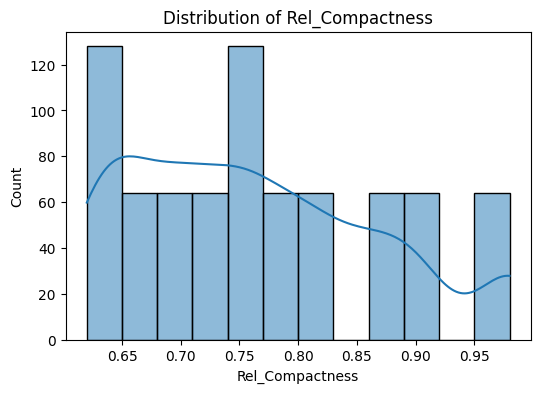

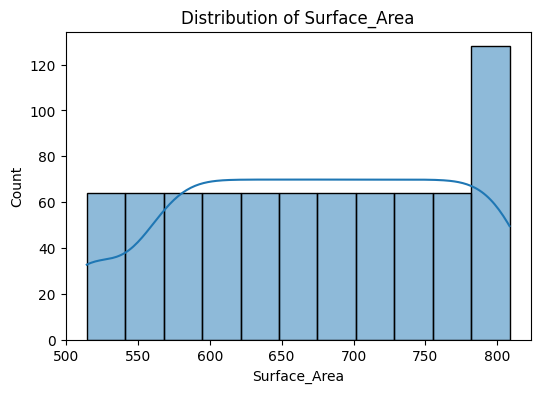

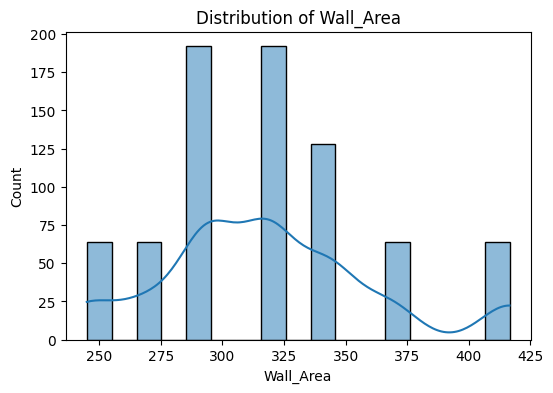

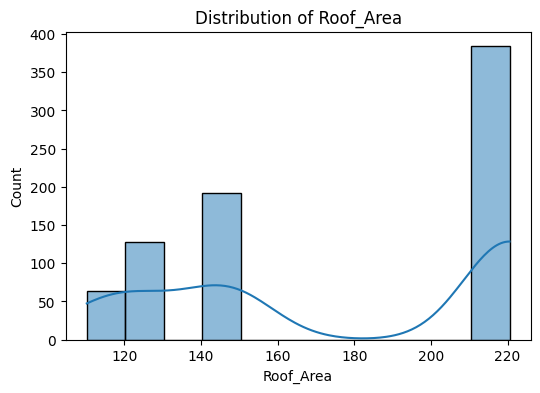

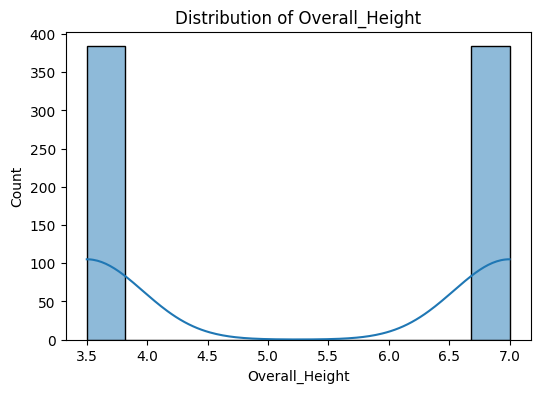

...

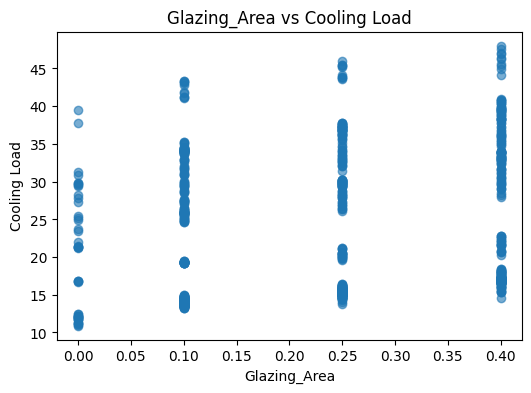

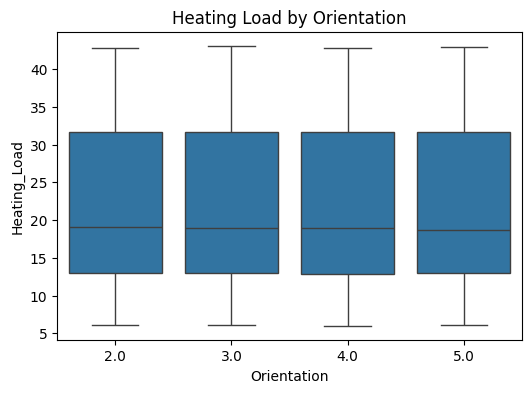

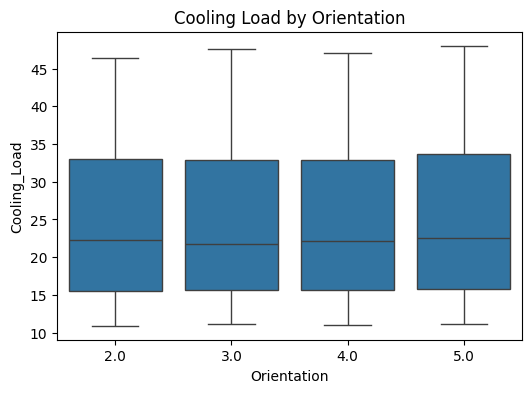

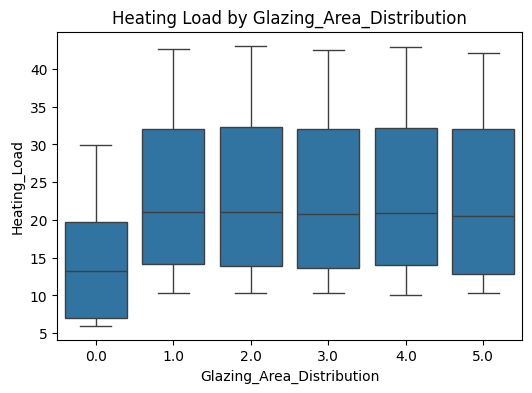

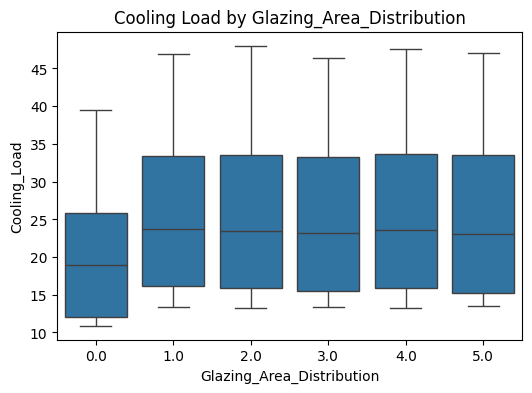

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load your data (adjust path if needed)
df = pd.read_csv('/content/energy-efficiency-dataset.csv')

# Rename columns for readability (optional)
df.columns = ['Rel_Compactness', 'Surface_Area', 'Wall_Area', 'Roof_Area', 'Overall_Height',
              'Orientation', 'Glazing_Area', 'Glazing_Area_Distribution', 'Heating_Load', 'Cooling_Load']

# Define features by type
continuous_features = ['Rel_Compactness', 'Surface_Area', 'Wall_Area', 'Roof_Area', 'Overall_Height', 'Glazing_Area']
categorical_features = ['Orientation', 'Glazing_Area_Distribution']

# 1. Plot individual feature distributions
for feature in continuous_features:
    plt.figure(figsize=(6,4))
    sns.histplot(df[feature], kde=True)
    plt.title(f'Distribution of {feature}')
    plt.show()

for feature in categorical_features:
    plt.figure(figsize=(6,4))
    sns.countplot(x=df[feature])
    plt.title(f'Count Plot of {feature}')
    plt.show()

# 2. Plot feature vs targets
for feature in continuous_features:
    plt.figure(figsize=(6,4))
    plt.scatter(df[feature], df['Heating_Load'], alpha=0.6)
    plt.title(f'{feature} vs Heating Load')
    plt.xlabel(feature)
    plt.ylabel('Heating Load')
    plt.show()

    plt.figure(figsize=(6,4))
    plt.scatter(df[feature], df['Cooling_Load'], alpha=0.6)
    plt.title(f'{feature} vs Cooling Load')
    plt.xlabel(feature)
    plt.ylabel('Cooling Load')
    plt.show()

for feature in categorical_features:
    plt.figure(figsize=(6,4))
    sns.boxplot(x=df[feature], y=df['Heating_Load'])
    plt.title(f'Heating Load by {feature}')
    plt.show()

    plt.figure(figsize=(6,4))
    sns.boxplot(x=df[feature], y=df['Cooling_Load'])
    plt.title(f'Cooling Load by {feature}')
    plt.show()


Distribution of Continuous Features and Target Variables


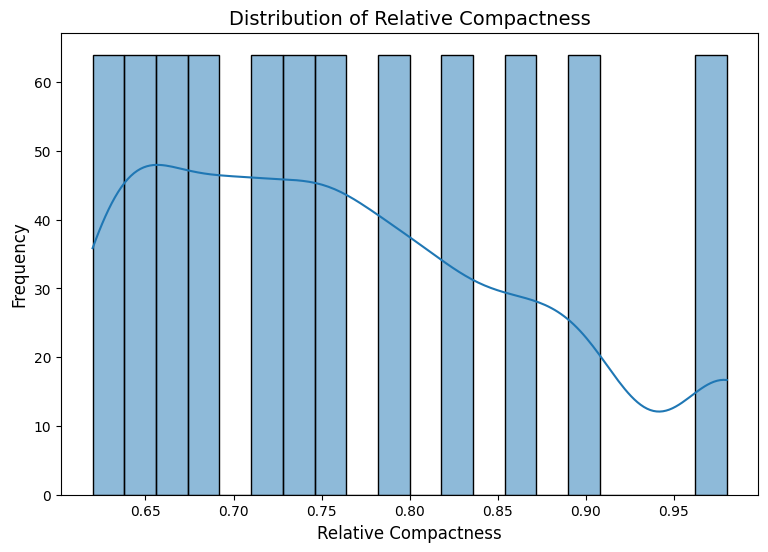

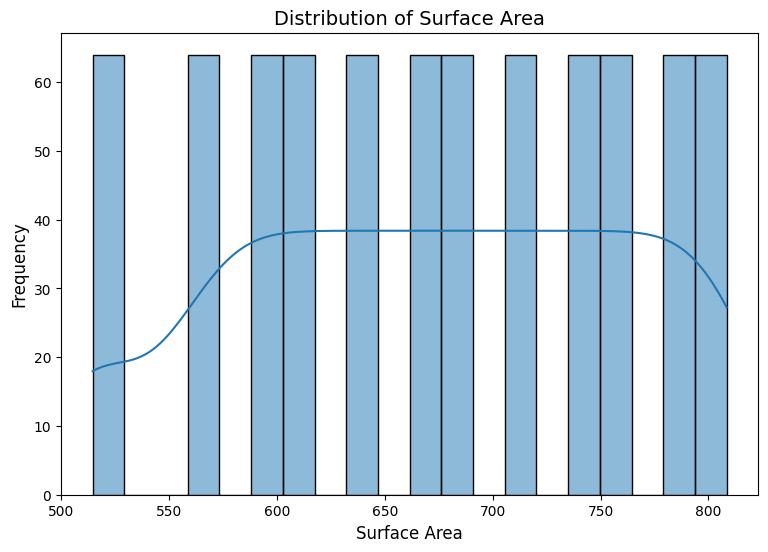

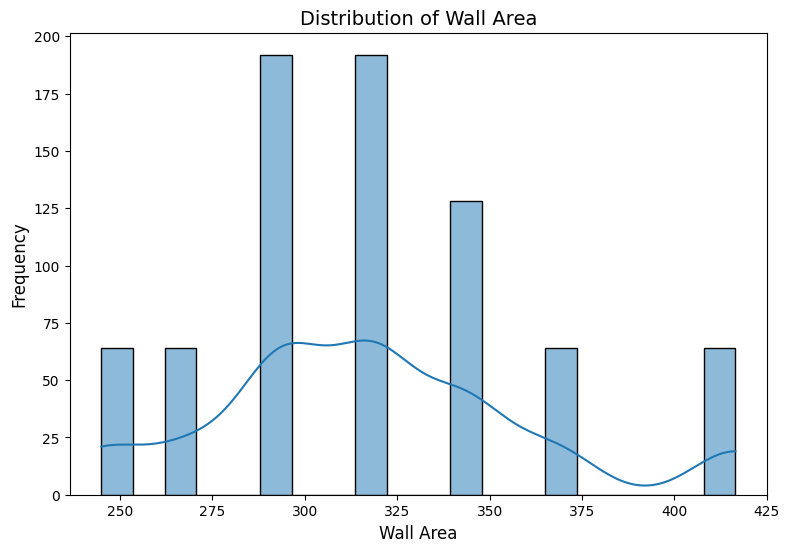

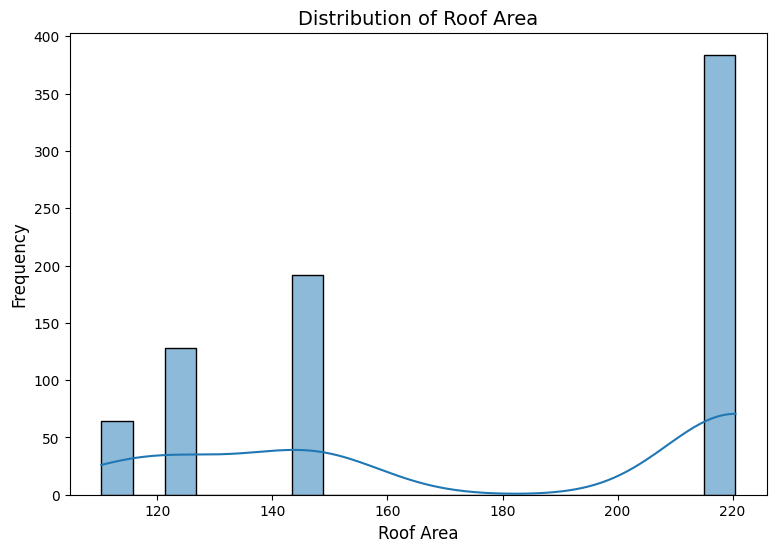

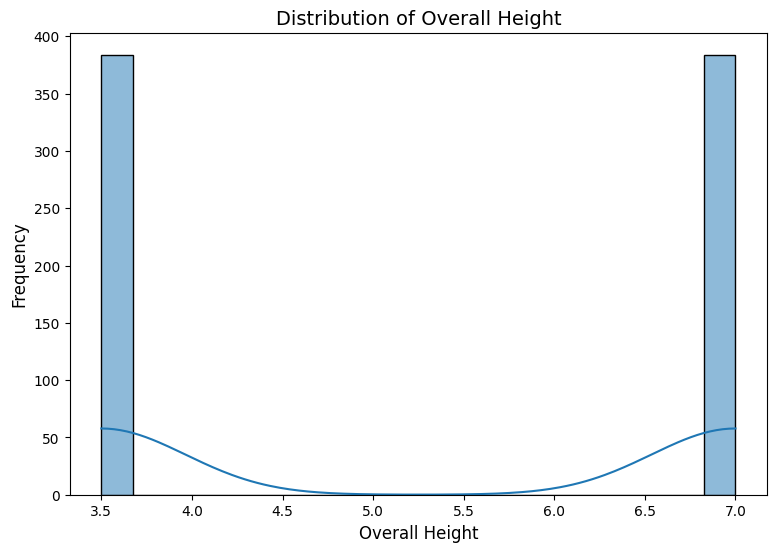

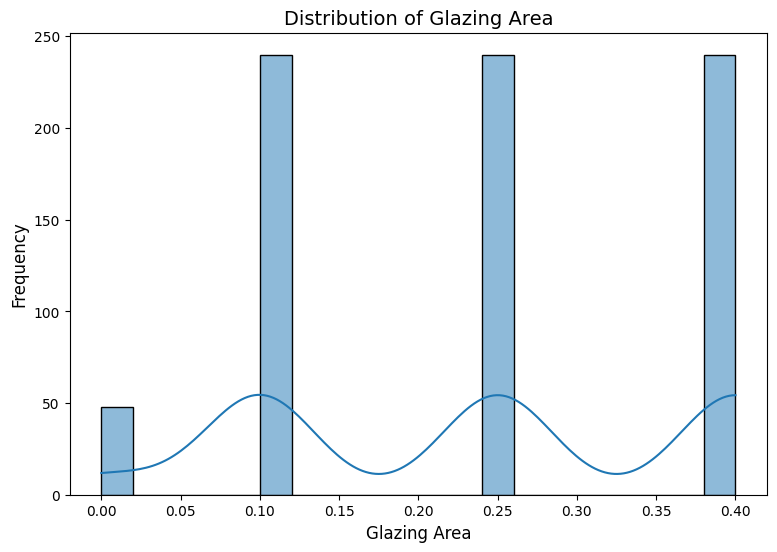

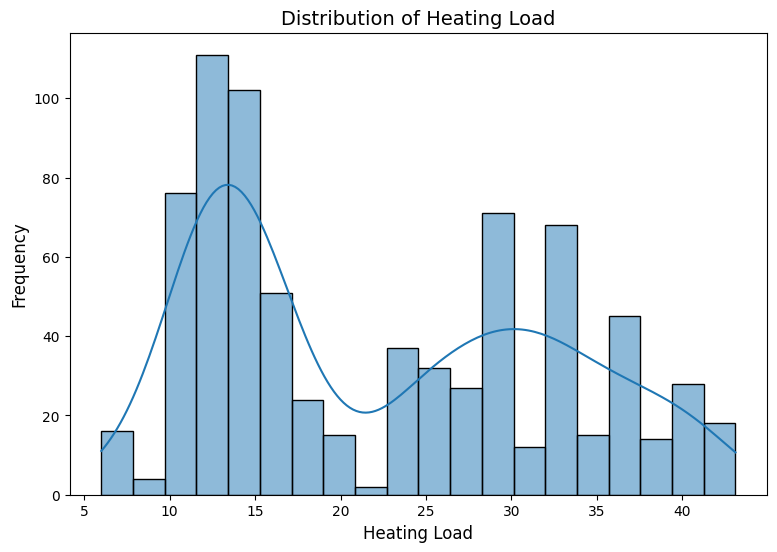

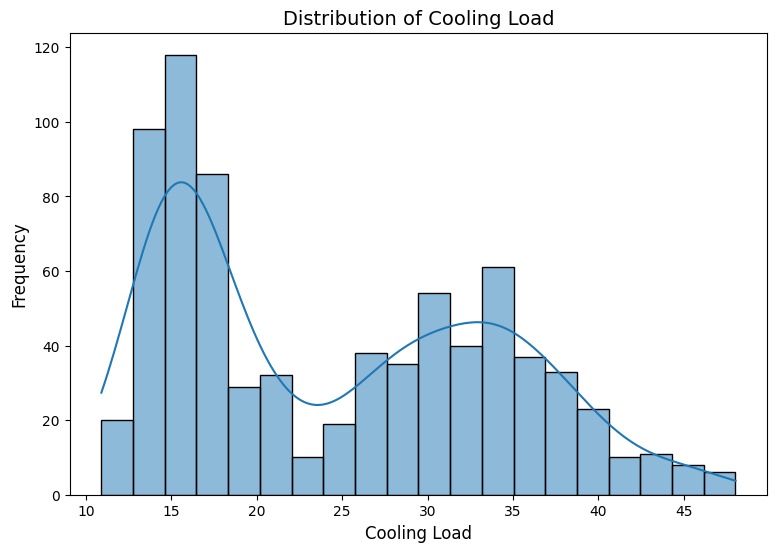


Relationship between Continuous Features and Target Variables


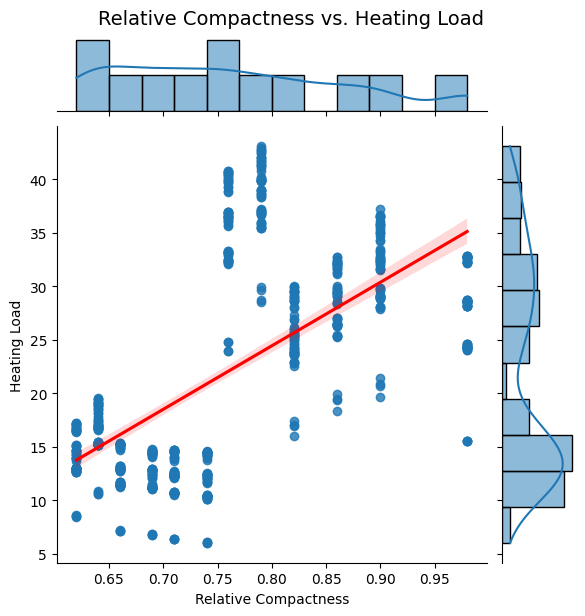

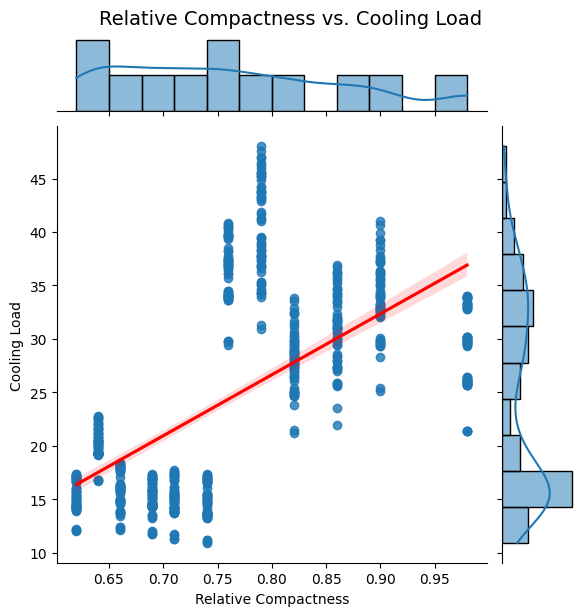

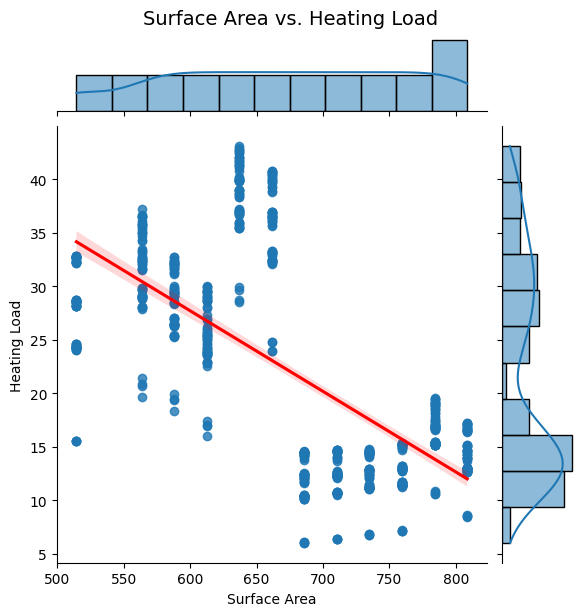

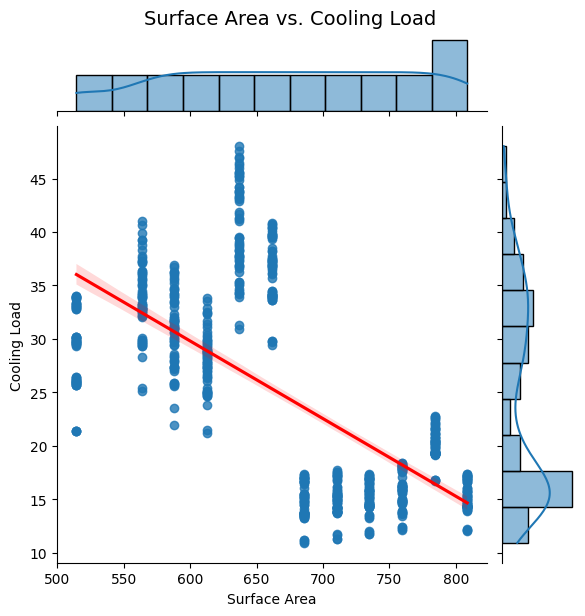

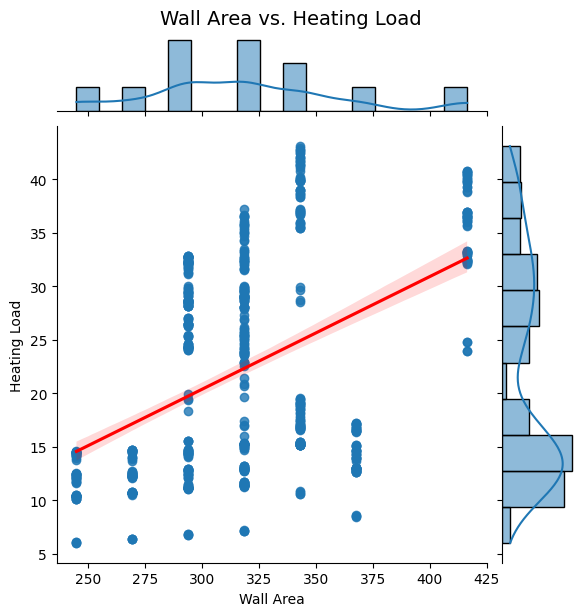

...

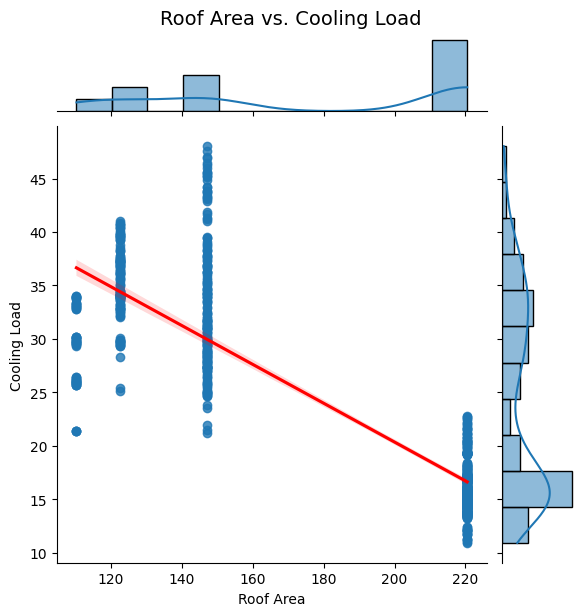

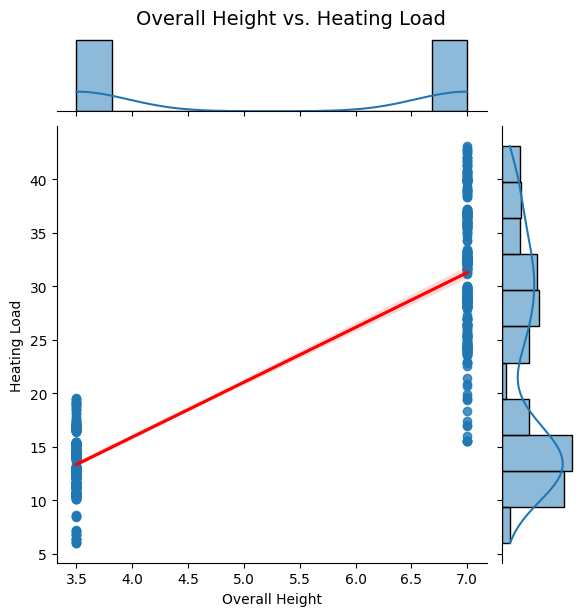

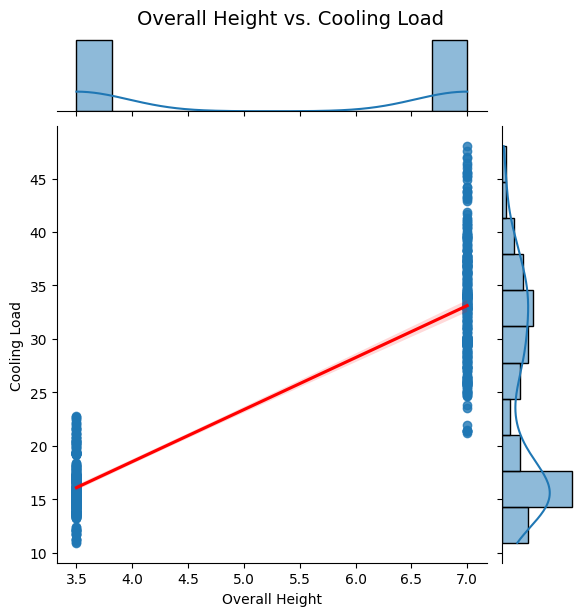

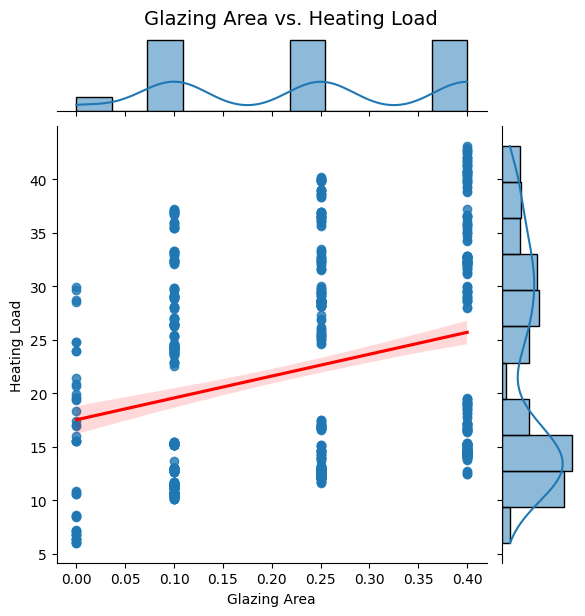

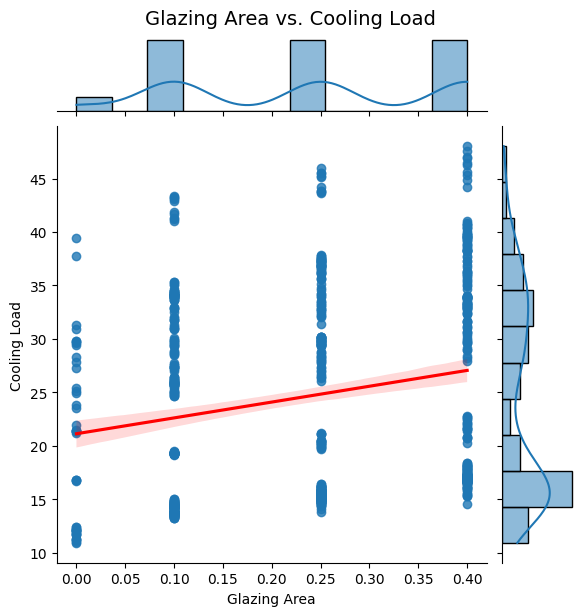


Pair Plot of Continuous Features and Target Variables


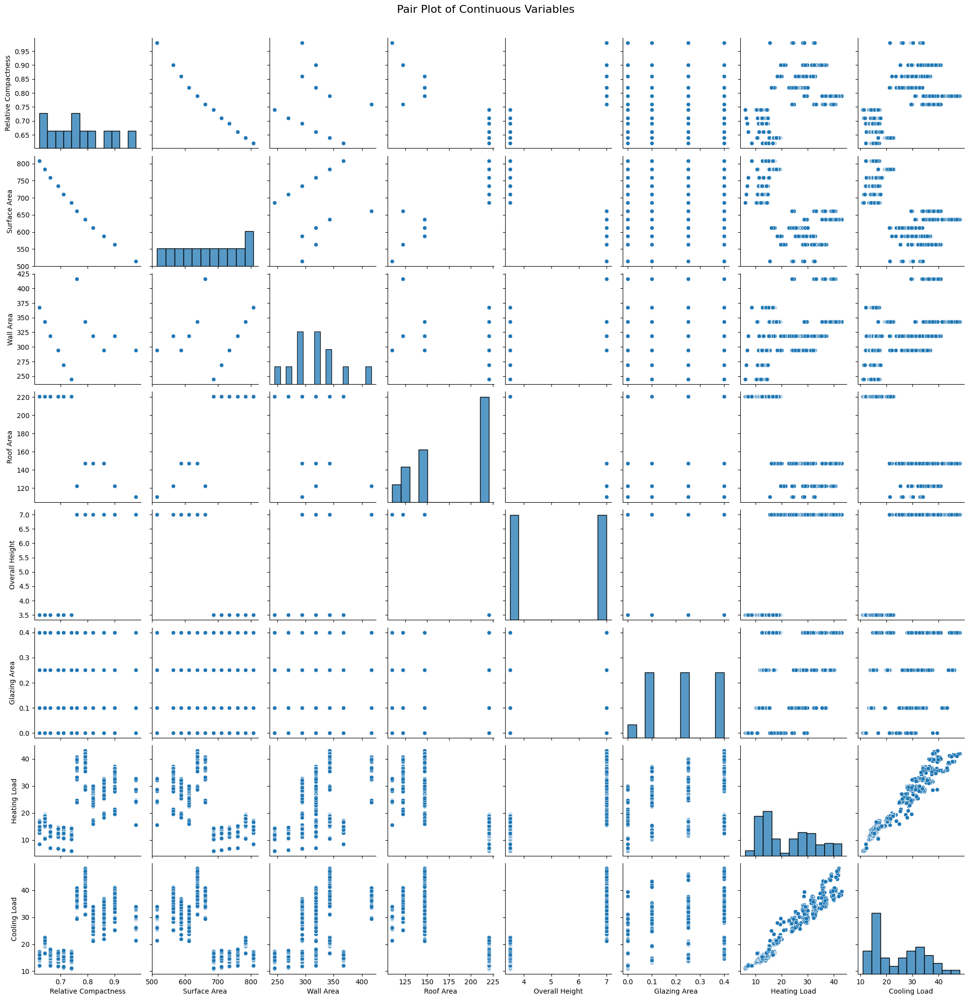


Correlation Heatmap


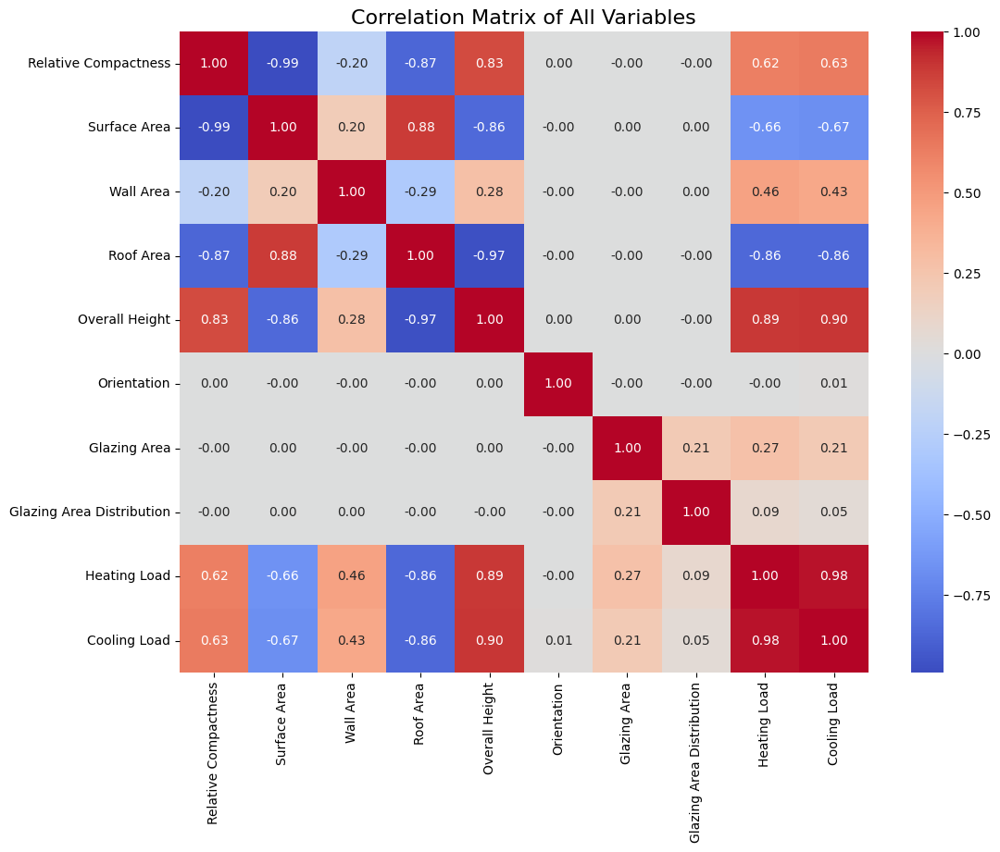

In [1]:
# Import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset from the CSV file
df = pd.read_csv('energy-efficiency-dataset.csv')

# Rename the columns for better readability
df.rename(columns={
    'X1': 'Relative Compactness',
    'X2': 'Surface Area',
    'X3': 'Wall Area',
    'X4': 'Roof Area',
    'X5': 'Overall Height',
    'X6': 'Orientation',
    'X7': 'Glazing Area',
    'X8': 'Glazing Area Distribution',
    'Y1': 'Heating Load',
    'Y2': 'Cooling Load'
}, inplace=True)

# Identify continuous and categorical features
continuous_features = [
    'Relative Compactness', 'Surface Area', 'Wall Area',
    'Roof Area', 'Overall Height', 'Glazing Area'
]
target_variables = ['Heating Load', 'Cooling Load']

# --- 1. Distribution of Continuous Features and Target Variables ---
print("Distribution of Continuous Features and Target Variables")
for col in continuous_features + target_variables:
    plt.figure(figsize=(9, 6))
    sns.histplot(df[col], kde=True, bins=20)
    plt.title(f'Distribution of {col}', fontsize=14)
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    plt.show()

# --- 2. Relationship between Continuous Features and Target Variables (Joint Plot) ---
print("\nRelationship between Continuous Features and Target Variables")
for feature in continuous_features:
    for target in target_variables:
        sns.jointplot(x=feature, y=target, data=df, kind='reg',
                      joint_kws={'line_kws':{'color':'red'}})
        plt.suptitle(f'{feature} vs. {target}', y=1.02, fontsize=14)
        plt.show()

# --- 3. Pair Plot of Continuous Features and Target Variables ---
print("\nPair Plot of Continuous Features and Target Variables")
sns.pairplot(df[continuous_features + target_variables])
plt.suptitle('Pair Plot of Continuous Variables', y=1.02, fontsize=16)
plt.show()

# --- 4. Correlation Heatmap ---
print("\nCorrelation Heatmap")
plt.figure(figsize=(12, 9))
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of All Variables', fontsize=16)
plt.show()

Shape of the dataset before dropping NaN values: (1296, 10)
Shape of the dataset after dropping NaN values: (768, 10)

--- Feature Importance for Heating Load (Y1) ---
Order of influence from highest to lowest:
                  Feature  Heating Load Importance
             Surface Area                 0.356170
                Roof Area                 0.333762
     Relative Compactness                 0.115256
             Glazing Area                 0.076154
           Overall Height                 0.071224
                Wall Area                 0.033839
Glazing Area Distribution                 0.012855
              Orientation                 0.000740

--- Feature Importance for Cooling Load (Y2) ---
Order of influence from highest to lowest:
                  Feature  Cooling Load Importance
     Relative Compactness                 0.408453
           Overall Height                 0.281204
             Surface Area                 0.129368
                Roof Area        

/tmp/ipython-input-384751641.py:67: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipython-input-384751641.py:69: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




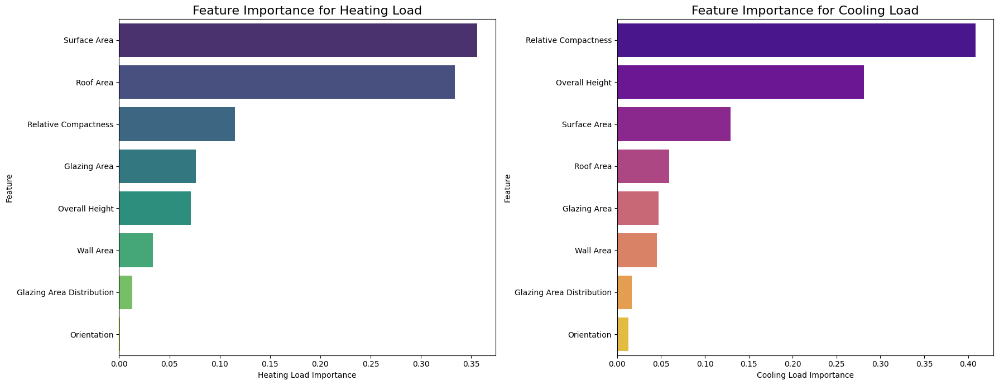


Visualizing top features for Heating Load: ['Surface Area', 'Roof Area', 'Relative Compactness']
Visualizing top features for Cooling Load: ['Relative Compactness', 'Overall Height', 'Surface Area']

--- 2D Visualization: Top 2 Features vs. Load ---


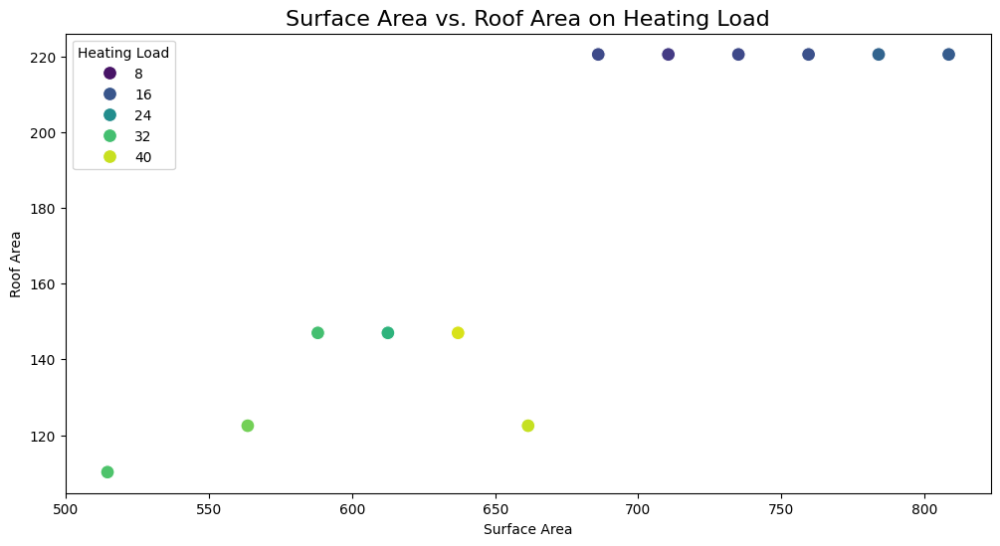

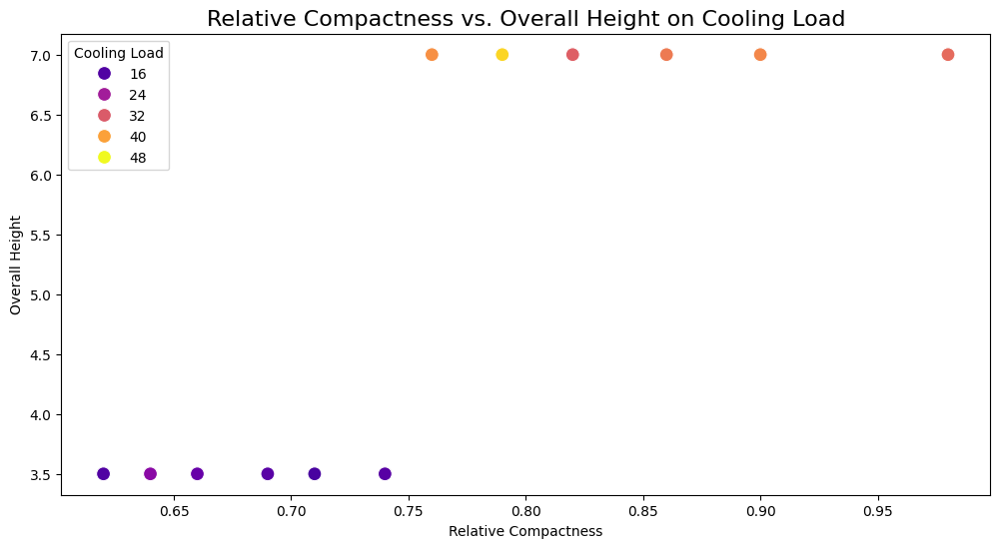

In [4]:
# Import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.ensemble import RandomForestRegressor

# --- 1. Load and Prepare the Data ---
# Load the dataset from the CSV file
df = pd.read_csv('energy-efficiency-dataset.csv')

# --- FIX: Remove rows with NaN values ---
# This line removes the empty rows at the end of the file that cause the error
print(f"Shape of the dataset before dropping NaN values: {df.shape}")
df.dropna(inplace=True)
print(f"Shape of the dataset after dropping NaN values: {df.shape}")


# Rename the columns for better readability
df.rename(columns={
    'X1': 'Relative Compactness', 'X2': 'Surface Area',
    'X3': 'Wall Area', 'X4': 'Roof Area',
    'X5': 'Overall Height', 'X6': 'Orientation',
    'X7': 'Glazing Area', 'X8': 'Glazing Area Distribution',
    'Y1': 'Heating Load', 'Y2': 'Cooling Load'
}, inplace=True)

# Define features (X) and target variables (y)
features = [
    'Relative Compactness', 'Surface Area', 'Wall Area', 'Roof Area',
    'Overall Height', 'Orientation', 'Glazing Area', 'Glazing Area Distribution'
]
X = df[features]
y1 = df['Heating Load']
y2 = df['Cooling Load']

# --- 2. Calculate and Rank Feature Importance ---
# Train Random Forest models to get feature importances
rf_heating = RandomForestRegressor(n_estimators=100, random_state=42)
rf_heating.fit(X, y1)

rf_cooling = RandomForestRegressor(n_estimators=100, random_state=42)
rf_cooling.fit(X, y2)

# Create a DataFrame for feature importances
importance_df = pd.DataFrame({
    'Feature': features,
    'Heating Load Importance': rf_heating.feature_importances_,
    'Cooling Load Importance': rf_cooling.feature_importances_
})

# Sort features by importance
heating_importance_sorted = importance_df.sort_values(by='Heating Load Importance', ascending=False)
cooling_importance_sorted = importance_df.sort_values(by='Cooling Load Importance', ascending=False)

# --- Display Feature Importance Rankings ---
print("\n--- Feature Importance for Heating Load (Y1) ---")
print("Order of influence from highest to lowest:")
print(heating_importance_sorted[['Feature', 'Heating Load Importance']].to_string(index=False))

print("\n--- Feature Importance for Cooling Load (Y2) ---")
print("Order of influence from highest to lowest:")
print(cooling_importance_sorted[['Feature', 'Cooling Load Importance']].to_string(index=False))

# Plot feature importances
fig, ax = plt.subplots(1, 2, figsize=(18, 7))
sns.barplot(x='Heating Load Importance', y='Feature', data=heating_importance_sorted, ax=ax[0], palette='viridis')
ax[0].set_title('Feature Importance for Heating Load', fontsize=16)
sns.barplot(x='Cooling Load Importance', y='Feature', data=cooling_importance_sorted, ax=ax[1], palette='plasma')
ax[1].set_title('Feature Importance for Cooling Load', fontsize=16)
plt.tight_layout()
plt.show()


# --- 3. Visualize Combined Effects of Top Features ---

# Get the names of the top features
top_2_heating_features = heating_importance_sorted['Feature'].iloc[:2].tolist()
top_3_heating_features = heating_importance_sorted['Feature'].iloc[:3].tolist()
top_2_cooling_features = cooling_importance_sorted['Feature'].iloc[:2].tolist()
top_3_cooling_features = cooling_importance_sorted['Feature'].iloc[:3].tolist()

print(f"\nVisualizing top features for Heating Load: {top_3_heating_features}")
print(f"Visualizing top features for Cooling Load: {top_3_cooling_features}")


# --- 2D Visualization (Top 2 Features vs. Load) ---
print("\n--- 2D Visualization: Top 2 Features vs. Load ---")
plt.figure(figsize=(12, 6))
sns.scatterplot(
    data=df,
    x=top_2_heating_features[0],
    y=top_2_heating_features[1],
    hue='Heating Load',
    palette='viridis',
    s=100 # marker size
)
plt.title(f'{top_2_heating_features[0]} vs. {top_2_heating_features[1]} on Heating Load', fontsize=16)
plt.show()

plt.figure(figsize=(12, 6))
sns.scatterplot(
    data=df,
    x=top_2_cooling_features[0],
    y=top_2_cooling_features[1],
    hue='Cooling Load',
    palette='plasma',
    s=100
)
plt.title(f'{top_2_cooling_features[0]} vs. {top_2_cooling_features[1]} on Cooling Load', fontsize=16)
plt.show()

In [5]:
# Import necessary libraries
import pandas as pd
import plotly.express as px
from IPython.display import display, HTML

# --- 1. Load and Prepare the Data ---
df = pd.read_csv('energy-efficiency-dataset.csv')
df.dropna(inplace=True) # Clean the data
df.rename(columns={
    'X1': 'Relative Compactness', 'X2': 'Surface Area', 'X3': 'Wall Area',
    'X4': 'Roof Area', 'X5': 'Overall Height', 'X6': 'Orientation',
    'X7': 'Glazing Area', 'X8': 'Glazing Area Distribution',
    'Y1': 'Heating Load', 'Y2': 'Cooling Load'
}, inplace=True)

# --- 2. Interactive 3D Plot for Heating Load ---
print("--- Visualizing Top 3 Features for Heating Load ---")
fig_heating = px.scatter_3d(
    df,
    x='Surface Area',
    y='Roof Area',
    z='Relative Compactness',
    color='Heating Load',
    color_continuous_scale='viridis',
    title='Interaction of Top 3 Features on Heating Load',
    width=800, height=700  # Adjust size if needed
)

# Convert the plot to HTML and display it
heating_html = fig_heating.to_html()
display(HTML(heating_html))


# --- 3. Interactive 3D Plot for Cooling Load ---
print("\n--- Visualizing Top 3 Features for Cooling Load ---")
fig_cooling = px.scatter_3d(
    df,
    x='Relative Compactness',
    y='Overall Height',
    z='Surface Area',
    color='Cooling Load',
    color_continuous_scale='plasma',
    title='Interaction of Top 3 Features on Cooling Load',
    width=800, height=700 # Adjust size if needed
)

# Convert the plot to HTML and display it
cooling_html = fig_cooling.to_html()
display(HTML(cooling_html))

--- Visualizing Top 3 Features for Heating Load ---



--- Visualizing Top 3 Features for Cooling Load ---
